# CSE 252A Computer Vision I Fall 2019 - Homework 4
## Instructor: Ben Ochoa
### Assignment published on: Tuesday, November 05, 2019
### Due on: Tuesday, November 19, 2019 11:59 pm

## Instructions
* Review the academic integrity and collaboration policies on the course website.
  * This assignment must be completed individually.
* All solutions must be written in this notebook.
  * This includes the theoretical problems, for which you **must** write your answers in Markdown cells (using LaTeX when appropriate).
  * Programming aspects of the assignment must be completed using Python in this notebook.
* If you want to modify the skeleton code, you may do so. It has only been provided as a framework for your solution.
* You may use Python packages (such as NumPy and SciPy) for basic linear algebra, but you may not use packages that directly solve the problem.
  * If you are unsure about using a specific package or function, then ask the instructor and/or teaching assistants for clarification.
* You must submit this notebook exported as a PDF. You must also submit this notebook as `.ipynb` file.
  * Submit both files (`.pdf` and `.ipynb`) on Gradescope.
  * **You must mark the PDF pages associated with each question in Gradescope. If you fail to do so, we may dock points.**
* It is highly recommended that you begin working on this assignment early.
* **Late policy: assignments submitted late will receive a 15% grade reduction for each 12 hours late (i.e., 30% per day). Assignments will not be accepted 72 hours after the due date. If you require an extension (for personal reasons only) to a due date, you must request one as far in advance as possible. Extensions requested close to or after the due date will only be granted for clear emergencies or clearly unforeseeable circumstances.**

## Problem 1: Epipolar Geometry [4 pts]
Consider two cameras whose image planes are the z=1 plane, and whose focal points are at (-12, 0, 0) and (12, 0, 0). We''ll call a point in the first camera (x, y), and a point in the second camera (u, v). Points in each camera are relative to the camera center. So, for example if (x, y) = (0, 0), this is really the point (-12, 0, 1) in world coordinates, while if (u, v) = (0, 0) this is the point (12, 0, 1).
![fig1](fig/fig1.png)

####  a) Suppose the points (x, y) = (8, 7) is matched to the point (u, v) = (2, 7). What is the 3D location of this point?

for the calculation I am moving the camera 1 to be the world origin (-12,0,0) -> (0,0,0) and the other camera will be (12,0,0) -> (24,0,0)


               .X
              / \
             /   \ 
            /     \ 
           /       \ 
          /         \
         /           \
$|-------|$   $|--------|$ 

     .O_1                   .O_2
     
$O_1 = (0,0,0)$

$O_2 = (24,0,0)$

$x_1 = (8,7) = (x_1/w_1,y_1/w_1,1)$

$x_2 = (2,7) = (x_2/w_2,y_2/w_2,1)$

$x_1 = P_1X$

$x_2 = P_2X$

X = $\begin{bmatrix}
x\\
y\\
z\\
1
\end{bmatrix}
$

$ P_1 =
\begin{bmatrix}
1&0&0&0\\
0&1&0&0\\
0&0&1&0\\
\end{bmatrix}
$

$P_2 = 
\begin{bmatrix}
1&0&0&24\\
0&1&0&0\\
0&0&1&0\\
\end{bmatrix}
$

based on epipolar geometry 

$ x_1 \times P_1X = 0$

$ = [7z-y]i-[8z-x]j+[8y-7x]k = [0,0,0]$

$ x_2 \times P_2X = 0$

$ = [7z-y]i-[2z-(x+24)]j+[2y-7(x+24)]k = [0,0,0]$

$
\begin{bmatrix}
7z-y\\
-(8z-x)\\
(7z-y)\\
-(2z-(x+24))\\
\end{bmatrix}
=
\begin{bmatrix}
0\\
0\\
0\\
0\\
\end{bmatrix}
$



z = 4

y = 28

x = 32 


** in my shifted world coordinates, back in the original coordinate it is 20


$ X = 
\begin{bmatrix}
20\\
28\\
4\\
1\\
\end{bmatrix}
$



#### b) Compute the Essential Matrix.

because the K matrices for both cameras are the identity matrix we can calculate E as $ t\times R$
and since the rotation matrix is also identity then the essential matrix becomes the skew symetric matrix for t

E = 

$\begin{bmatrix} 0 & 0 & 0 \\0 & 0 & -24 \\0 & 24 & 0 \\\end{bmatrix}$

#### c) Consider points that lie on the line x + z = 2, y = 0. Use the same stereo set up as before. Write an analytic expression giving the disparity of a point on this line after it projects onto the two images, as a function of its position in the right image. So your expression should only involve the variables u and d (for disparity). Your expression only needs to be valid for points on the line that are in front of the cameras, i.e. with z > 1.

shifting the eq to my camera 1 centered at world origin coordinate system the line equation becomes z = 14-x 

d-baseline = 24
f = 1

$X_l = fx/z = x/(14-x)$

$X_r = f(x-d_{baseline})/z = (x-24)/(14-x)$

disparity = $X_l - X_r$

$ = 24/(14-x) $

$X_r = u$

disparity = $24(1+u)/(-10)$






In [86]:
import numpy as np
np.linalg.pinv(np.array([[0,0,0],[0,0,-24],[0,24,0]]))@np.array([0,0,0])

array([0., 0., 0.])

## Problem 2: Epipolar Rectification [4 pts]
In stereo vision, image rectification is a common preprocessing step to simplify the problem of finding
matching points between images. The goal is to warp image views such that the epipolar lines are
horizontal scan lines of the input images. Suppose that we have captured two images $I_A$ and $I_B$ from
identical calibrated cameras separated by a rigid transformation

$_{A}^{B}\textrm{T}= \begin{bmatrix}
\boldsymbol{R} & \boldsymbol{t} \\ 
0^T & 1
\end{bmatrix}$ and $\boldsymbol{t}=[t_x,t_y,t_z]$

Without loss of generality assume that camera A's optical center is positioned at the origin and that its optical axis is in the direction of the z-axis.

From the lecture, a rectifying transform for each image should map the epipole to a point infinitely far away in the horizontal direction $ H_{A}e_{A} = H_{B}e_{B} = [1, 0, 0]^T$. Consider the following special cases:

#### a) Pure horizontal translation $\boldsymbol{t} = [t_{x}, 0, 0]^T$, $\boldsymbol{R} = \boldsymbol{I}$

i)

$e_b = 
\begin{bmatrix}
1\\
0\\
0\\
\end{bmatrix}
$

$e_a = 
\begin{bmatrix}
1\\
0\\
0\\
\end{bmatrix}
$

ii)

$l_b => y = Y_a $

iii) no homography needed, images are already rectified


#### b) Pure translation orthogonal to the optical axis $\boldsymbol{t} = [t_{x}, t_{y}, 0]^T$, $\boldsymbol{R} = \boldsymbol{I}$

i) - here e_x is a free variable, it is assumed we set that equal to 1 after the homography

$e_b = 
\begin{bmatrix}
e_{bx}\\
t_y/t_x\cdot e_{bx}\\
0\\
\end{bmatrix}
$

$e_a =  
\begin{bmatrix}
e_{ax}\\
t_x/t_y\cdot e_{ax}\\
0\\
\end{bmatrix}
$

ii) $l_b => y = t_y/t_x \cdot x - (x_at_y - t_xy_a)/t_x$

iii)

$ H_a = 
\begin{bmatrix}
0&0&0\\
-t_x/t_y&1&0\\
0&0&0\\
\end{bmatrix}
$

$ H_b = 
\begin{bmatrix}
0&0&0\\
-t_y/t_x&1&0\\
0&0&0\\
\end{bmatrix}
$


#### c) Pure translation along the optical axis $\boldsymbol{t} = [0, 0, t_{z}]^T$, $\boldsymbol{R} = \boldsymbol{I}$

i)
$e_a = [0,0,0].T$
$e_b = [0,0,0].T$

ii) $l_b => y = y_a/x_a \cdot x$

iii) Not possible would need to use polar rectification since the epipoles are aligned with each other along the z axis


#### d) Pure rotation $\boldsymbol{t} = [0, 0, 0]^T$, $\boldsymbol{R}$ is an arbitrary rotation matrix

the essential matrix is zero in this situation. Therefore epipolar geometry does not apply. this becomes a homography problem. 


For each of these cases, determine whether or not epipolar rectification is possible. Include the following information for each case:

(i) The epipoles $e_A$ and $e_B$

(ii) The equation of the epipolar line $l_B$ in $I_B$ corresponding to the point $[x_A, y_A, 1]^T$ in $I_A$ (if one exists)

(iii) A plausible solution to the rectifying transforms $H_A$ and $H_B$ (if one exists) that attempts to minimize distortion (is as close as possible to a 2D rigid transformation). Note that the above 4 cases are special cases; a simple solution should become apparent by looking at the epipolar lines.

One or more of the above rigid transformations may be a degenerate case where rectification is not
possible or epipolar geometry does not apply. If so, explain why.

## Problem 3: Sparse Stereo Matching [32 pts]

In this problem we will play around with sparse stereo matching methods. You will work on two image pairs, a warrior figure and a figure from the Matrix movies. These files both contain two images, two camera matrices, and two sets of corresponding points (extracted by manually clicking the images). For illustration, I have run my code on a third image pair (dino1.png, dino2.png). This data is also provided for you to debug your code, but **you should only report results on warrior and matrix**. In other words, where I include one (or a pair) of images in the assignment below, you will provide the same thing but for BOTH matrix and warrior. Note that the matrix image pair is harder, in the sense that the matching algorithms we are implementing will not work quite as well. You should expect good results, however, on warrior.

### Corner Detection [8 pts]
The first thing we need to do is to build a corner detector. This should be done according to http://cseweb.ucsd.edu/classes/fa19/cse252A-a/lec7.pdf. You should fill in the function <code>corner_detect</code> below, and take as input <code>corner_detect(image, nCorners, smoothSTD, windowSize)</code> where smoothSTD is the standard deviation of the smoothing kernel and windowSize is the window size for corner detector and non maximum suppression. In the lecture the corner detector was implemented using a hard threshold. Do not do that but instead return the nCorners strongest corners after non-maximum suppression. This way you can control exactly how many corners are returned. Run your code on all four images (with nCorners = 20) and show outputs as shown below. You may find scipy.ndimage.filters.gaussian_filter easy to use for smoothing. In this problem, try the following different standard deviation ($\sigma$) parameters for the Gausian smoothing kernel: 0.5, 1, 2 and 4. For a particular $\sigma$, you should take the kernel size to be $6\times\sigma$ (add $1$ if the kernel size is even). So for example if $\sigma=2$, corner detection kernel size should be $13$. This should be followed throughtout all experiments in this assignment.

There will be a total of 16 images as outputs : (4 choices of smoothSTD x 2 matrix imgs x 2 warrior imgs). 


![dinoCorner1](fig/dinoCorner1.png)
![dinoCorner2](fig/dinoCorner2.png)

Comment on your results and observations (3/8 points). You don't need to comment per output, just **discuss** any trends you see for the detected corners as you change the windowSize and increase the smoothing w.r.t the two pair of images warrior and matrix. Also discuss if you are able to find corresponding corners for same pair of images. 

In [1]:
import numpy as np
import imageio
import matplotlib.pyplot as plt
from scipy.ndimage.filters import gaussian_filter
import scipy.signal as signal
#https://stackoverflow.com/questions/25216382/gaussian-filter-in-scipy
#http://www.adeveloperdiary.com/data-science/computer-vision/applying-gaussian-smoothing-to-an-image-using-python-from-scratch/

In [6]:
nCorners = 20
smoothSTDs = [0.5, 1, 2, 4]
imgs_mat = []
imgs_war = []
grayimgs_mat = []
grayimgs_war = []

for i in range(2):
    img_mat = imageio.imread('p4/matrix/matrix' + str(i) + '.png')
    imgs_mat.append(img_mat) 
    #grayimgs_mat.append(rgb2gray(img_mat))
    # Comment above line and uncomment below line to
    # downsize your image in case corner_detect runs slow in test 
    grayimgs_mat.append(rgb2gray(img_mat)[::2, ::2])
    # if you unleash the power of numpy you wouldn't need to downsize, it'll be fast
    img_war = imageio.imread('p4/warrior/warrior' + str(i) + '.png')
    imgs_war.append(img_war)
    grayimgs_war.append(rgb2gray(img_war)[::2, ::2])
    


In [5]:
def rgb2gray(rgb):
    """ Convert rgb image to grayscale.
    """
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.114])

In [3]:
# im_1 = grayimgs_war[0]
# im_2 = grayimgs_war[1]

In [7]:
def new_nms(image,windowSize):
    
    nms_im = image.copy()
    for j in range(windowSize//2,nms_im.shape[0]-windowSize//2):
        for i in range(windowSize//2,nms_im.shape[1]-windowSize//2):
            
            window = nms_im[j-windowSize//2:j+windowSize//2+1\
                          ,i-windowSize//2:i+windowSize//2+1]
    
            win_center = nms_im[j,i]
            
            if len(np.where(window>win_center)[0]) > 0:
                # there are pixels larger than our center pixel - delete
                nms_im[j,i]=0
    return nms_im

In [8]:
# find the index of the top n corners
def max_sort(C_map,num_corners):
    
    # flatten the array
    flat = C_map.ravel() # make a list of values
    sort = np.argsort(flat, axis=None)[::-1][:num_corners] # sort by max
    indices = np.unravel_index(sort,dims = C_map.shape)
    
    corner_loc = [[],[]] # going to make a list of [y,x] corner location pairs
    
    for i in range(num_corners): 
    
        corner_loc[0].extend([indices[0][i]])
        corner_loc[1].extend([indices[1][i]])
    
    return corner_loc
    


In [9]:
def convolve_row_wise(image,kernel): # function for row kernel
    output_im_shape = (image.shape[0],image.shape[1]-(kernel.shape[1]-1))
    output_im = np.zeros(output_im_shape)
    
    m = kernel.shape[1]
    #print(m)
    for j in range(image.shape[0]): # all rows
        for i in range(m//2,image.shape[1]-m//2): # losing some columns

            kernel_output = 0
        
            for k in range(m): 
                #print(k,i,j)
                kernel_output += image[j,i+(k-m//2)]*kernel[0,k]    
            
            output_im[j,i-m//2] = kernel_output
            
    return output_im 
    

    
    
def convolve_col_wise(image,kernel): # function for column kernel
    
    output_im_shape = (image.shape[0]-(kernel.shape[0]-1),image.shape[1])
    output_im = np.zeros(output_im_shape)

    m = kernel.shape[0]
    #print(m)
    for j in range(m//2,image.shape[0]-m//2): # all rows
        for i in range(image.shape[1]): # losing some columns

            kernel_output = 0

            for k in range(m): 
                #print(k,i,j)
                kernel_output += image[j+(k-m//2),i]*kernel[k,0]    

            output_im[j-m//2,i] = kernel_output

    return output_im   


In [10]:
def corner_func(image,windowSize):

    # define the kernels
    d_x = np.array([[-.5,0,.5]])
    d_y = np.array([[-.5,0,.5]]).T
    
    
    dx_im = convolve_row_wise(image,d_x) # we lose 2 columns
    dy_im = convolve_col_wise(image,d_y) # we lose 2 rows
    #print(dx_im.shape,dy_im.shape)
    # address any padding issues
    smooth_y,smooth_x = image.shape
    pad = 1
    dx_im = np.hstack((np.zeros((smooth_y,pad)),dx_im,np.zeros((smooth_y,pad))))
    dy_im = np.vstack((np.zeros((pad,smooth_x)),dy_im,np.zeros((pad,smooth_x))))
    
    
    # building moment matrices:
    
    Ixx = np.multiply(dx_im,dx_im)
    Iyy = np.multiply(dy_im,dy_im)
    Ixy = np.multiply(dx_im,dy_im)
    
    # building corner function
    
    
    # shape of new image after kernel op with the window
    corner_shape = (image.shape[0]-(windowSize-1),image.shape[1]-(windowSize-1))
    corner_im    = np.zeros(corner_shape)
    
    for j in range(windowSize//2,image.shape[0]-windowSize//2):
        
        for i in range(windowSize//2,image.shape[1]-windowSize//2):  


            win_j_min = j-windowSize//2
            win_j_max = j+windowSize//2+1
            win_i_min = i-windowSize//2
            win_i_max = i+windowSize//2+1
            
            C = np.array([[0,0],[0,0]])
            C[0,0] = np.sum(Ixx[win_j_min:win_j_max,win_i_min:win_i_max])
            C[0,1] = np.sum(Ixy[win_j_min:win_j_max,win_i_min:win_i_max])
            C[1,0] = C[0,1]
            C[1,1] = np.sum(Iyy[win_j_min:win_j_max,win_i_min:win_i_max])
            
#             # this could be faster #
#             for jj in range(len(window_coordsj)):
#                 for ii in range(len(window_coordsi)):
                    
#                     # setting window function to 1's
#                     C[0,0] += Ixx[window_coordsj[jj],window_coordsi[ii]]
#                     C[0,1] += Ixy[window_coordsj[jj],window_coordsi[ii]]
#                     C[1,0] += Ixy[window_coordsj[jj],window_coordsi[ii]] 
#                     C[1,1] += Iyy[window_coordsj[jj],window_coordsi[ii]]
                    
                    
            # find the min eigenvalue:
            small_eig = np.min(np.linalg.eigvals(C))

            threshold = .04 # .04-.14

            if small_eig >= threshold:
                
                corner_im[j-windowSize//2,i-windowSize//2] = small_eig
    return corner_im

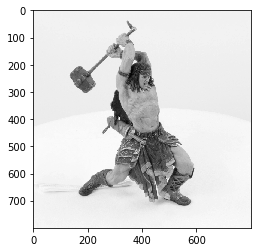

In [12]:
plt.figure(figsize = (4,4))
plt.imshow(im_1,cmap = 'gray')
plt.show()

In [11]:
def corner_detect(image, nCorners, smoothSTD, windowSize):
    """Detect corners on a given image.

    Args:
        image: Given a grayscale image on which to detect corners.
        nCorners: Total number of corners to be extracted.
        smoothSTD: Standard deviation of the Gaussian smoothing kernel.
        windowSize: Window size for corner detector and non maximum suppression.

    Returns:
        Detected corners (in image coordinate) in a numpy array (n*2).

    """
    
    """
    Put your awesome numpy powered code here:
    """
    
    # define window operation
    smooth_im = gaussian_filter(image,smoothSTD,truncate = 3)
    
    # find corners
    corner_im = corner_func(smooth_im,windowSize)
              
    #non max suppression on the corner image
    nms_c_im = new_nms(corner_im,windowSize)
    
    # pick our max corners
    max_corners = max_sort(nms_c_im,nCorners)
    # take the top 100 corners, makes life easier down the road
    top_100     = max_sort(nms_c_im,100)
    
    # truncate the edges of the image so they are the same size as our Corner_image - 
    # puts everything that the same origin
    new_image   = image[windowSize//2:-windowSize//2,windowSize//2:-windowSize//2]            
                    
    
    
    return max_corners,top_100,corner_im,new_image

In [12]:
nCorners = 20
smoothSTDs = [0.5, 1, 2, 4]
imgs_mat = []
imgs_war = []
grayimgs_mat = []
grayimgs_war = []

for i in range(2):
    img_mat = imageio.imread('p4/matrix/matrix' + str(i) + '.png')
    imgs_mat.append(img_mat) 
    grayimgs_mat.append(rgb2gray(img_mat))
    # Comment above line and uncomment below line to
    # downsize your image in case corner_detect runs slow in test 
    #grayimgs_mat.append(rgb2gray(img_mat)[::2, ::2])
    # if you unleash the power of numpy you wouldn't need to downsize, it'll be fast
    img_war = imageio.imread('p4/warrior/warrior' + str(i) + '.png')
    imgs_war.append(img_war)
    grayimgs_war.append(rgb2gray(img_war))


In [13]:
im_1 = grayimgs_war[0]
im_2 = grayimgs_war[1]


import time
st = time.time()

C_s, top100,C_im,trunc_im_1 = corner_detect(im_2, nCorners, smoothSTDs[0], 3)
#C_s2,C_im2,trunc_im_2 = corner_detect(im_2, nCorners, smoothSTDs[0], 5)

runtime = time.time() - st
print(runtime)

182.61709856987


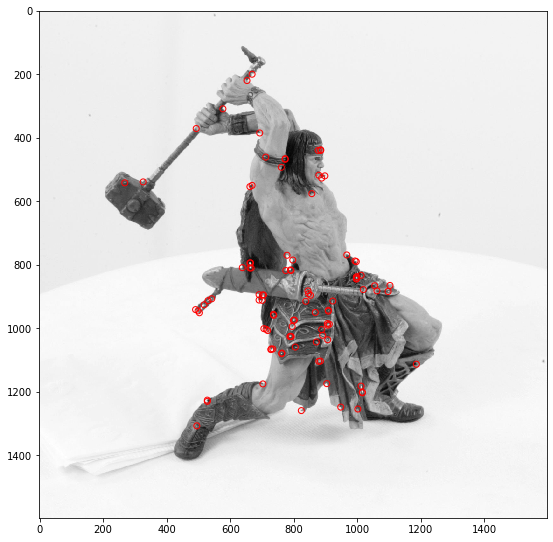

In [15]:
plt.figure(figsize = (20,20))
plt.subplot(1,2,1)
plt.imshow(trunc_im_1,cmap = 'gray')
plt.scatter(top100[1][:],top100[0][:],s=36, edgecolors='r', facecolors='none')
# # plt.subplot(1,2,2)
# # plt.imshow(trunc_im_2,cmap = 'gray')
# # plt.scatter(ccs2[1][:],ccs2[0][:],s=36, edgecolors='r', facecolors='none')
# # plt.show()

# # C_im.shape

In [13]:
def show_corners_result(imgs, corners):
    fig = plt.figure(figsize=(15, 15))
    ax1 = fig.add_subplot(221)
    ax1.imshow(imgs[0], cmap='gray')
    ax1.scatter(corners[0][:, 0], corners[0][:, 1], s=36, edgecolors='r', facecolors='none')

    ax2 = fig.add_subplot(222)
    ax2.imshow(imgs[1], cmap='gray')
    ax2.scatter(corners[1][:, 0], corners[1][:, 1], s=36, edgecolors='r', facecolors='none')
    plt.show()
    


## I ran this once and saved the outputs to a pickle file to save time on iterations

In [32]:
# detect corners on warrior and matrix image sets
# adjust your corner detection parameters here
nCorners = 20
smoothSTDs = [0.5, 1, 2, 4]
imgs_mat = []
imgs_war = []
grayimgs_mat = []
grayimgs_war = []

# Read the two images and convert it to Greyscale
for i in range(2):
    img_mat = imageio.imread('p4/matrix/matrix' + str(i) + '.png')
    imgs_mat.append(img_mat) 
    #grayimgs_mat.append(rgb2gray(img_mat))
    # Comment above line and uncomment below line to
    # downsize your image in case corner_detect runs slow in test 
    grayimgs_mat.append(rgb2gray(img_mat)[::2, ::2])
    # if you unleash the power of numpy you wouldn't need to downsize, it'll be fast
    img_war = imageio.imread('p4/warrior/warrior' + str(i) + '.png')
    imgs_war.append(img_war)
    grayimgs_war.append(rgb2gray(img_war)[::2, ::2])

mat1_20c = []
mat1_100c = []
mat1_c_im = []
mat1_new_im = []
war1_20c = []
war1_100c = []
war1_c_im = []
war1_new_im = []

mat2_20c = []
mat2_100c = []
mat2_c_im = []
mat2_new_im = []
war2_20c = []
war2_100c = []
war2_c_im = []
war2_new_im = []


for smoothSTD in smoothSTDs:
    windowSize = int(6*smoothSTD)
    if windowSize%2==0: windowSize += 1

    
    print ("SmoothSTD:", smoothSTD, "WindowSize:", windowSize)
    for i in range(2):
        
        if i == 0:
            # matrix
            max_corners,top_100,corner_im,new_image = \
            corner_detect(grayimgs_mat[i], nCorners, smoothSTD, windowSize)

            mat1_20c.append(max_corners) # top 20 corners
            mat1_100c.append(top_100)    # top 100 corners
            mat1_c_im.append(corner_im)  # corner image
            mat1_new_im.append(new_image)   # truncated image - accounts for info lost during processing

            # warrior
            max_corners,top_100,corner_im,new_image = \
            corner_detect(grayimgs_war[i], nCorners, smoothSTD, windowSize)

            war1_20c.append(max_corners)
            war1_100c.append(top_100)
            war1_c_im.append(corner_im)
            war1_new_im.append(new_image)
            
        else:
            
            max_corners,top_100,corner_im,new_image = \
            corner_detect(grayimgs_mat[i], nCorners, smoothSTD, windowSize)

            mat2_20c.append(max_corners) # top 20 corners
            mat2_100c.append(top_100)    # top 100 corners
            mat2_c_im.append(corner_im)  # corner image
            mat2_new_im.append(new_image)   # truncated image - accounts for info lost during processing

            # warrior
            max_corners,top_100,corner_im,new_image = \
            corner_detect(grayimgs_war[i], nCorners, smoothSTD, windowSize)

            war2_20c.append(max_corners)
            war2_100c.append(top_100)
            war2_c_im.append(corner_im)
            war2_new_im.append(new_image)

            
output_dict = {}

output_dict['warrior'] = {'left':{'top 20':war1_20c,'top 100':war1_100c,\
                                  'R_map': war1_c_im,'new_im':war1_new_im},\
                          'right':{'top 20':war2_20c,'top 100':war2_100c,\
                                  'R_map': war2_c_im,'new_im':war2_new_im}}
                          
output_dict['matrix']  = {'left':{'top 20':mat1_20c,'top 100':mat1_100c,\
                                  'R_map': mat1_c_im,'new_im':mat1_new_im},\
                          'right':{'top 20':mat2_20c,'top 100':mat2_100c,\
                                  'R_map': mat2_c_im,'new_im':mat2_new_im}}
'''
- the dictionary contains the images generated from the corner detection algorithms
- it is broken up into warrior and matrix images and subsequently left and right images
- top 20 keeps the top twenty corners for that permutation
- top 100 keeps the top 100 corners
- the response map is saved
- the new truncated image is also saved
- 


'''
# create a dictionary to save all of the data


    #show_corners_result(imgs_mat, crns_mat) #uncomment this to show your output!
    #show_corners_result(imgs_war, crns_war)

SmoothSTD: 0.5 WindowSize: 3
SmoothSTD: 1 WindowSize: 7
SmoothSTD: 2 WindowSize: 13
SmoothSTD: 4 WindowSize: 25


'\n- the dictionary contains the images generated from the corner detection algorithms\n\n- it is broken up into warrior and matrix images and subsequently left and right images\n- top 20 keeps the top twenty corners for that permutation\n- top 100 keeps the top 100 corners\n- the response map is saved\n- the new truncated image is also saved\n- \n\n\n'

In [ ]:
# # save the dictionary
# import pickle
# pickle_file = open('corner_dict.pkl','wb') 
# pickle.dump(output_dict, pickle_file)


### Load Image and corner dictionary - plot results ###

In [23]:
import pickle
file = open('corner_dict.pkl','rb')
corner_data = pickle.load(file)


In [24]:
x = corner_data['warrior']['left']['top 20']

### Warrior

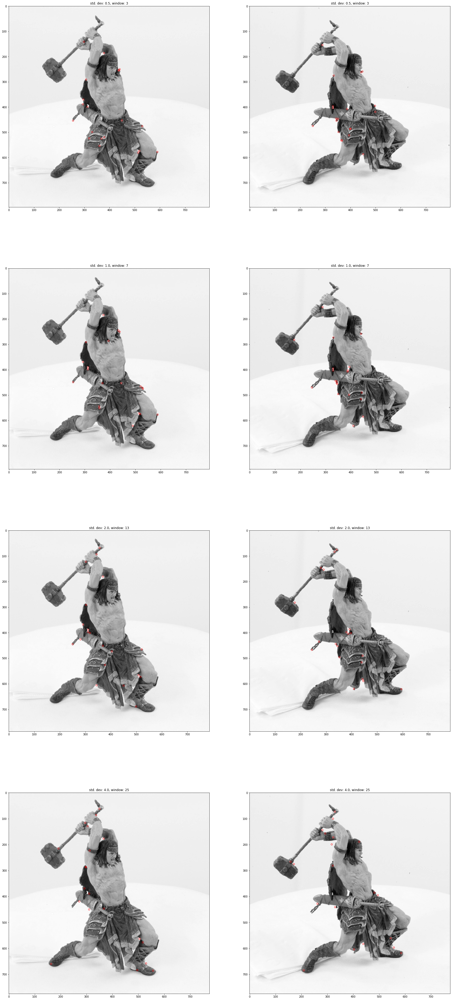

In [99]:
plt.figure(figsize = (30,70))
std_s = [0.5, 1, 2, 4]
windows = [3,7,13,25]
for i in range(0,4):
    plt.subplot(4,2,2*(i+1)-1)
    plt.title('std. dev: %.1f, window: %i'%(std_s[i],windows[i]))
    plt.imshow(corner_data['warrior']['left']['new_im'][i],cmap = 'gray')
    plt.scatter(corner_data['warrior']['left']['top 20'][i][1][:],\
                corner_data['warrior']['left']['top 20'][i][0][:],\
                s=36, edgecolors='r', facecolors='none')
    plt.subplot(4,2,2*(i+1))
    plt.title('std. dev: %.1f, window: %i'%(std_s[i],windows[i]))
    plt.imshow(corner_data['warrior']['right']['new_im'][i],cmap = 'gray')
    plt.scatter(corner_data['warrior']['right']['top 20'][i][1][:],\
                corner_data['warrior']['right']['top 20'][i][0][:],\
                s=36, edgecolors='r', facecolors='none')

#### Matrix

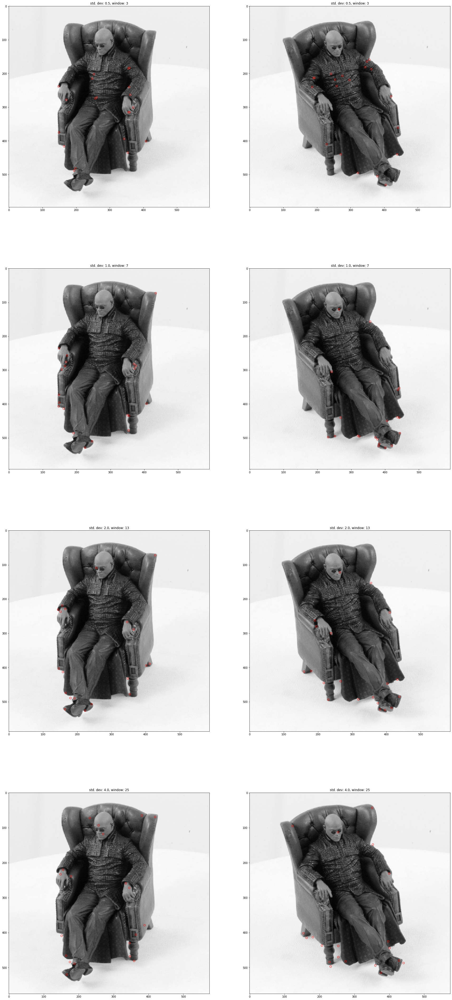

In [100]:
plt.figure(figsize = (30,70))
std_s = [0.5, 1, 2, 4]
windows = [3,7,13,25]
for i in range(0,4):
    plt.subplot(4,2,2*(i+1)-1)
    plt.title('std. dev: %.1f, window: %i'%(std_s[i],windows[i]))
    plt.imshow(corner_data['matrix']['left']['new_im'][i],cmap = 'gray')
    plt.scatter(corner_data['matrix']['left']['top 20'][i][1][:],\
                corner_data['matrix']['left']['top 20'][i][0][:],\
                s=50, edgecolors='r', facecolors='none')
    plt.subplot(4,2,2*(i+1))
    plt.title('std. dev: %.1f, window: %i'%(std_s[i],windows[i]))
    plt.imshow(corner_data['matrix']['right']['new_im'][i],cmap = 'gray')
    plt.scatter(corner_data['matrix']['right']['top 20'][i][1][:],\
                corner_data['matrix']['right']['top 20'][i][0][:],\
                s=50, edgecolors='r', facecolors='none')

### ANALYSIS 

The goal of the corner matching is to find distinct corner features that are properly size relative to the object, well positioned on the vertex of the corner feature, and sufficiently spatially separated.

The smaller window size with less smoothing is successful in precisely locating corners, however there is not a lot of separation between points in the corner-rich zones. This will likely lead to issues in feature-matching because there will be multiple points in the corresponding zone in the second image and can create a noisy match with one of the many points in the zone. Additionally will the small window and little smoothing there is a trend of identifying points of texture patterns and other small points that do not accurately reflect the true corner features of the objects. This will obviously lead to issues in matching because of the patterns. That being said the small window was able to successfully find corresponding points in both images. Accurately matching them will be a challenge.

As we go larger in window size and increase the smoothing we tend to get better spacial separation (due to the larger NMS windows) between features and necesarily larger features. This is in part because the smoothing eliminates the smaller texture patterns in addition to the window function requiring the larger features. For the intermediate window sizes we also maintain good corner localization over the vertex of the corners. The larger window leads to a slight decrease in finding corresponding points because the corner centers are not clustered the same corner-rich zones, but they do find a good proportion of similar corner points.

Increasing window size/smoothing reaches an optimum and then yields poorer results. There are multiple factors, the blurring is begins to wash out the corner features and the corner window is required features larger than the features inherent to the object which is why you see the corner centers offset from the corner features - yielding fewer closely corresponding corner points. 

There is a balance to be maintained between feature size, corner separation, finding similar points, and accurately finding the corner center. The best sizing is one that can adequately capture the corner features at the proper scale for the object and maintain good point separation while finding the corresponding points. For the case of our images it is the two intermediate sets of parameters. Although the matrix image will always be hard to match due to the occlusion of features between images.

### NCC (Normalized Cross-Correlation) Matching [2 pts]

Write a function <code>ncc_match</code> that implements the NCC matching algorithm for two input windows.
NCC = $\sum_{i,j}\tilde{W_1} (i,j)\cdot \tilde{W_2} (i,j)$ where $\tilde{W} = \frac{W - \overline{W}}{\sqrt{\sum_{k,l}(W(k,l) - \overline{W})^2}}$ is a mean-shifted and normalized version of the window and $\overline{W}$ is the mean pixel value in the window W.

In [19]:
def ncc_match(img1, img2, c1, c2, R):
    """Compute NCC given two windows.

    Args:
        img1: Image 1.
        img2: Image 2.
        c1: Center (in image coordinate) of the window in image 1.
        c2: Center (in image coordinate) of the window in image 2.
        R: R is the radius of the patch, 2 * R + 1 is the window size

    Returns:
        NCC matching score for two input windows.

    """
    
    """
    Your code here:
    """
    windowSize = 2*R+1
    
    window_1 = img1[c1[0]-windowSize//2:c1[0]+windowSize//2+1,\
                    c1[1]-windowSize//2:c1[1]+windowSize//2+1]
    
    window_2 = img2[c2[0]-windowSize//2:c2[0]+windowSize//2+1,\
                    c2[1]-windowSize//2:c2[1]+windowSize//2+1]
    
    # adjust for padding
    
    #calculate means
    mean_1 = np.mean(window_1)
    mean_2 = np.mean(window_2)
    
    # if the pixels are black
    if mean_2 == 0:
        matching_score = -1
    else:
        #create mean shifted windows
        mean_shift_1 = window_1[:,:]-mean_1
        mean_shift_2 = window_2[:,:]-mean_2


        #try to vectorize some of the calcs
        W_1_tilda = mean_shift_1/np.sqrt(np.sum((mean_shift_1)**2))
        W_2_tilda = mean_shift_2/np.sqrt(np.sum((mean_shift_2)**2))

        matching_score = np.sum(W_1_tilda*W_2_tilda)

    return matching_score

In [11]:
# score= ncc_match(im_1,im_2,(400,400),(400,420),100)
# score

In [20]:
# test NCC match
img1 = np.array([[1, 2, 3, 4], [4, 5, 6, 8], [7, 8, 9, 4]])
img2 = np.array([[1, 2, 1, 3], [6, 5, 4, 4], [9, 8, 7, 3]])
print (ncc_match(img1, img2, np.array([1, 1]), np.array([1, 1]), 1))
# should print 0.8546
print (ncc_match(img1, img2, np.array([1,2]), np.array([1,2]), 1))
# should print 0.8457
print (ncc_match(img1, img2, np.array([1, 1]), np.array([1,2]), 1))
# should print 0.6258

0.8546547739343037
0.8457615282174419
0.6258689611426174


### Naive Matching [4 pts]

Equipped with the corner detector and the NCC matching function, we are ready to start finding correspondances. One naive strategy is to try and find the best match between the two sets of corner points. Write a script that does this, namely, for each corner in image1, find the best match from the detected corners in image2 (or, if the NCC match score is too low, then return no match for that point). You will have to figure out a good threshold (NCCth) value by experimentation. Write a function <code>naive_matching</code> and call it as below. Examine your results for 10, 20, and 30 detected corners in each image. Choose number of detected corners to maximize the number of correct matching pairs. <code>naive_matching</code> will call your NCC matching code. 
**Properly label or mention which output corresponds to which choice of number of corners. Total number of output is 6 images** (3 choice of number of corners for each matrix and warrior), where one image is like below:


Number of Corners: 10
<img src = "fig/dinoMatch.png" alt="dino match" width="800"/>

In [25]:
def naive_matching(img1, img2, corners1, corners2, R, NCCth,dist_thresh):
    """Compute NCC given two windows.

    Args:
        img1: Image 1.
        img2: Image 2.
        corners1: Corners in image 1 (nx2)
        corners2: Corners in image 2 (nx2)
        R: NCC matching radius
        NCCth: NCC matching score threshold

    Returns:
        NCC matching result a list of tuple (c1, c2), 
        c1 is the 1x2 corner location in image 1, 
        c2 is the 1x2 corner location in image 2. 

    """
    
    """
    Your code here:
    """
    m = len(corners1[0])
    n = len(corners2[0])
    mask = np.ones((m,n))
    corr_mat = np.zeros((m,n))
    c1,c2 = corners1,corners2
    masked_corr_mat = mask*corr_mat
    distance_threshold = dist_thresh
    match_pairs = [] # stores the m,n index values of the corners
    
    
    for mm in range(m):
        for nn in range(n):
            corr_mat[mm,nn] = ncc_match(img1, img2, (c1[0][mm],c1[1][mm]),\
                                                  (c2[0][nn],c2[1][nn]), R)

    # start the algorithm
    keep_looking = True
    while keep_looking == True:
        
        
        masked_corr_mat = mask*corr_mat
        
        # find the max value in the masked correlation matrix
        max_ind = np.where(masked_corr_mat == np.amax(masked_corr_mat))
        max_ind = (max_ind[0][0],max_ind[1][0])
        
        # store temporarily
        max_val = np.amax(masked_corr_mat)
        
        # check to make sure our best match is above our threshold
        if max_val < NCCth:
            
            keep_looking = False
            break
            
            
    
            
        # set index of max value to -1 in correlation matrix (temporarily)
        corr_mat[max_ind[0],max_ind[1]] = -1
        
        # search for next best value in the corr_mat
        row_max = np.max(corr_mat[max_ind[0],:])
        col_max = np.max(corr_mat[:,max_ind[1]])
        next_best_match = max(row_max,col_max)
        
        # set best match back to OG value
        corr_mat[max_ind[0],max_ind[1]] = max_val
        
        # compare matches, store the pair if it is good
        if (1-max_val)<((1-next_best_match)*distance_threshold):
            match_pairs.append(max_ind)
            
            
            
        # set mask array of the rows and columns of best match = 0
        mask[max_ind[0],:],mask[:,max_ind[1]] = 0,0
        
    
    return match_pairs
        
 
    

In [150]:
x = np.array([[1,2,3],[1,2,3],[1,2,3]])
y = np.where(x == np.amax(x))
y[1][0]

2

In [14]:
(matl_10y,matl_10x)[0][3]

399

### because I reduced my image size by a factor of 2 I am using WINDOW/st.dev combo that is also reduced to keep the relative scale the same - using std.dev = 1 and window = 7 

In [26]:
# You are free to modify code here, create your helper functions etc.
# detect corners on warrior and matrix sets

# nCorners = 20 # Do this for 10, 20 and 30 corners
# smoothSTD = 2
# windowSize = 13

c_config = 1 # using the corner set pertaining to std dev = 1 window = 7

# i saved the top 100 corners and then I pull the amount i want for each matching comparison - 10,20,30
matl_im = corner_data['matrix']['left']['new_im'][c_config]
matl_10x  = corner_data['matrix']['left']['top 100'][c_config][1][:10]
matl_10y  = corner_data['matrix']['left']['top 100'][c_config][0][:10]
matl_20x  = corner_data['matrix']['left']['top 100'][c_config][1][:20]
matl_20y  = corner_data['matrix']['left']['top 100'][c_config][0][:20]
matl_30x  = corner_data['matrix']['left']['top 100'][c_config][1][:30]
matl_30y  = corner_data['matrix']['left']['top 100'][c_config][0][:30]

matr_im = corner_data['matrix']['right']['new_im'][c_config]
matr_10x  = corner_data['matrix']['right']['top 100'][c_config][1][:10]
matr_10y  = corner_data['matrix']['right']['top 100'][c_config][0][:10]
matr_20x  = corner_data['matrix']['right']['top 100'][c_config][1][:20]
matr_20y  = corner_data['matrix']['right']['top 100'][c_config][0][:20]
matr_30x  = corner_data['matrix']['right']['top 100'][c_config][1][:30]
matr_30y  = corner_data['matrix']['right']['top 100'][c_config][0][:30]


In [27]:
# warrior
warl_im = corner_data['warrior']['left']['new_im'][c_config]
warl_10x  = corner_data['warrior']['left']['top 100'][c_config][1][:10]
warl_10y  = corner_data['warrior']['left']['top 100'][c_config][0][:10]
warl_20x  = corner_data['warrior']['left']['top 100'][c_config][1][:20]
warl_20y  = corner_data['warrior']['left']['top 100'][c_config][0][:20]
warl_30x  = corner_data['warrior']['left']['top 100'][c_config][1][:30]
warl_30y  = corner_data['warrior']['left']['top 100'][c_config][0][:30]

warr_im = corner_data['warrior']['right']['new_im'][c_config]
warr_10x  = corner_data['warrior']['right']['top 100'][c_config][1][:10]
warr_10y  = corner_data['warrior']['right']['top 100'][c_config][0][:10]
warr_20x  = corner_data['warrior']['right']['top 100'][c_config][1][:20]
warr_20y  = corner_data['warrior']['right']['top 100'][c_config][0][:20]
warr_30x  = corner_data['warrior']['right']['top 100'][c_config][1][:30]
warr_30y  = corner_data['warrior']['right']['top 100'][c_config][0][:30]

In [190]:
# match corners
R = 8
NCCth = 0.5 # Put your threshold
d_thresh = .8
matching_mat = naive_matching(matl_im/255, matr_im/255/255, (matl_10y,matl_10x), (matr_10y,matr_10x), R, NCCth,d_thresh)
#matching_war = naive_matching(imgs_war[0]/255, imgs_war[1]/255, crns_war[0], crns_war[1], R, NCCth)
matching_mat

[(9, 6), (2, 1), (8, 5)]

In [31]:
#### THIS IS MY TEST CODE #### IGNORE ####


# plot matching result

def show_matching_result(img1, img2,c1,c2, matching,i):
    num_corner = [10,20,30]
    fig = plt.figure(figsize=(20, 20))
    plt.imshow(np.hstack((img1, img2)), cmap='gray') # two dino images are of different sizes, resize one before use
    for p1, p2 in matching:
        
        
        plt.scatter(c1[1][p1], c1[0][p1], s=35, edgecolors='r', facecolors='none')
        plt.scatter(c2[1][p2] + img1.shape[1], c2[0][p2], s=35, edgecolors='r', facecolors='none')
        plt.plot([c1[1][p1],c2[1][p2] + img1.shape[1]],[c1[0][p1],c2[0][p2]])
        plt.title('%i Corners'%num_corner[i])
    plt.savefig('matrix_matching%i.png'%num_corner[i])
    plt.show()

# #Uncomment to show output
# #print("Number of Corners:", nCorners)
# #show_matching_result(imgs_mat[0], imgs_mat[1], matching_mat)
# show_matching_result(matl_im, matr_im,(matl_10y,matl_10x),(matr_10y,matr_10x), matching_mat,0)

In [28]:
R = 30
NCCth = .2
d_thresh = .97
mat_match10 = naive_matching(matl_im/255, matr_im/255, (matl_10y,matl_10x), (matr_10y,matr_10x), R, NCCth,d_thresh)
mat_match20 = naive_matching(matl_im/255, matr_im/255, (matl_20y,matl_20x), (matr_20y,matr_20x), R, NCCth,d_thresh)
mat_match30 = naive_matching(matl_im/255, matr_im/255, (matl_30y,matl_30x), (matr_30y,matr_30x), R, NCCth,d_thresh)

In [29]:
mat_match10

[(9, 6), (7, 5), (2, 1), (8, 0), (3, 4)]

### MATRIX Window Analysis

There is not much you can do for the matrix, the pose change and the occlusion make it hard to match any points with any form of accuracy. Dropping the NCCth and increasing the distance threshold value increase the number of matches but there no way to reliably get positive matches. Increasing the window size helps try and capture some of the larger features but it is largely unsucessful

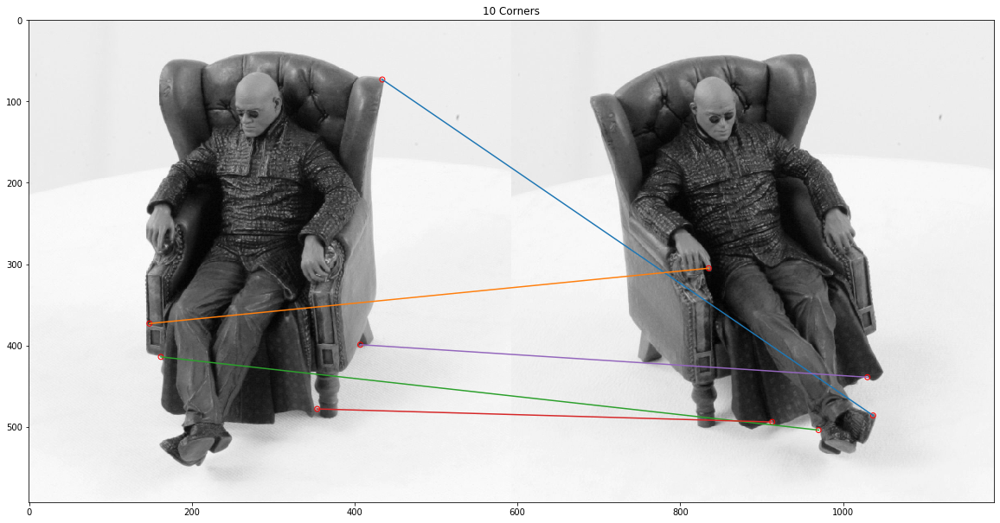

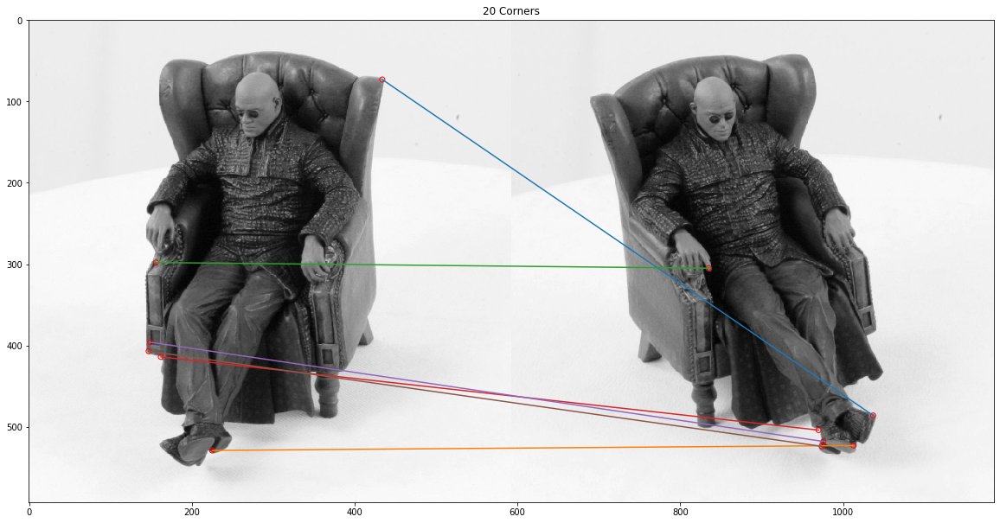

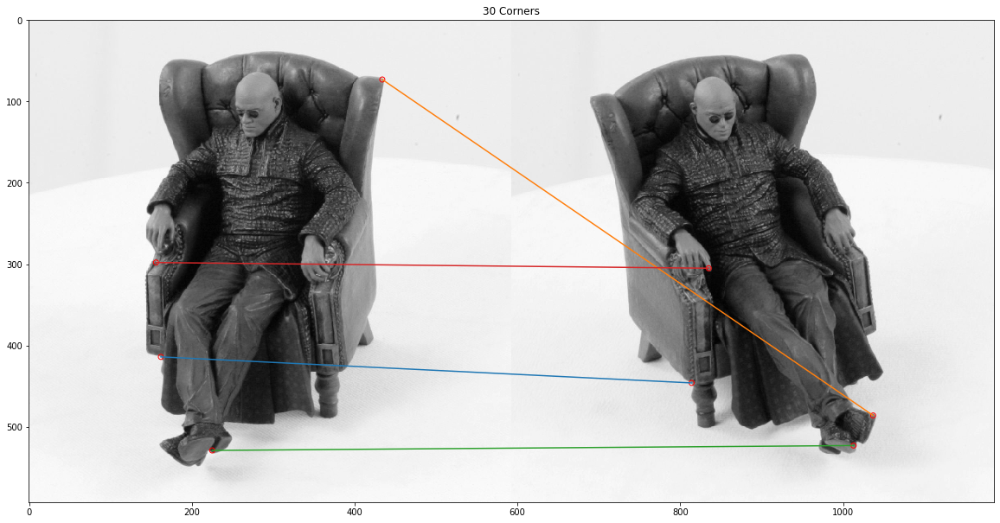

In [32]:
mat_bundle = [[(matl_10y,matl_10x),(matr_10y,matr_10x),mat_match10],\
              [(matl_20y,matl_20x),(matr_20y,matr_20x),mat_match20],\
              [(matl_30y,matl_30x),(matr_30y,matr_30x),mat_match30]]

#           10,20,30    c1,c2,matchpair   y_values,x_values or pair set
#         mat_bundle[0]         [0]               [0]

for i in range(3):
    show_matching_result(matl_im,matr_im,mat_bundle[i][0],mat_bundle[i][1],mat_bundle[i][2],i)

### Motivation for hyper parameters for warrior

Because the warrior several larger more distinct corner features, and many smaller, very similar corner features I decided to tune the window size to capture the larger corner features because I believe this will yield the the highest percentage of positive matches. Experiments with smaller windows and lower NCC/difference_threshold showed higher overal corner matches but lower percentages of accurate matches. As a result of the larger window, the NCCth needed to be lowered because the likelihood of higher correspondance decreases with window size. 

Using the .80 difference threshold severely limited the number of point matches due to the fact that many contours on the warrior and because of this, some positive matches were removed. By increasing the d_thresh, it allows corners that have close matches to be counted and this proved to yield higher positive match results.

I may very well be overfitting the data here but I believe the logic follows

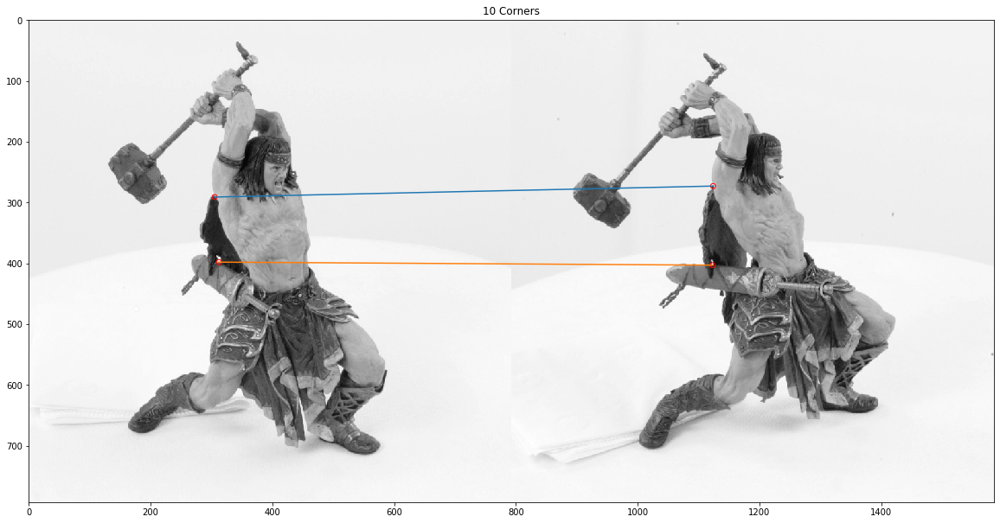

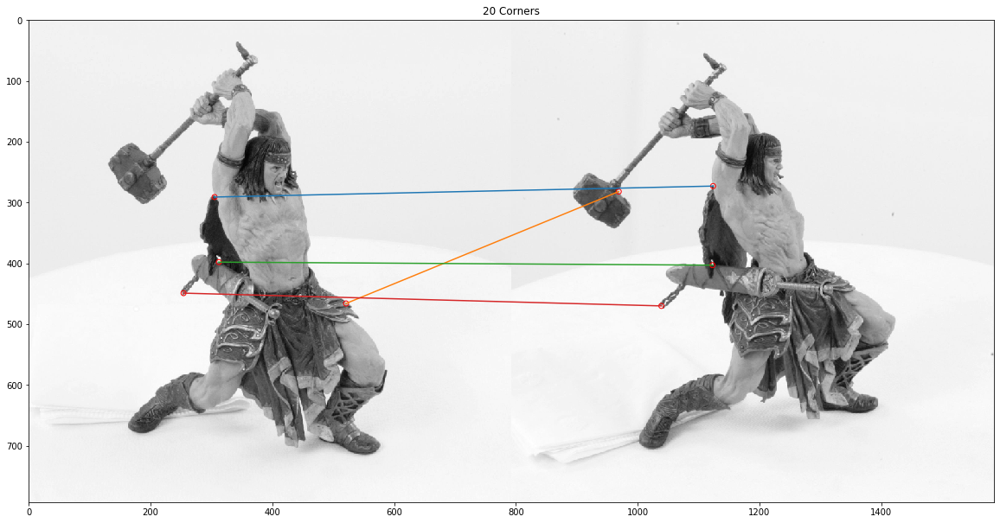

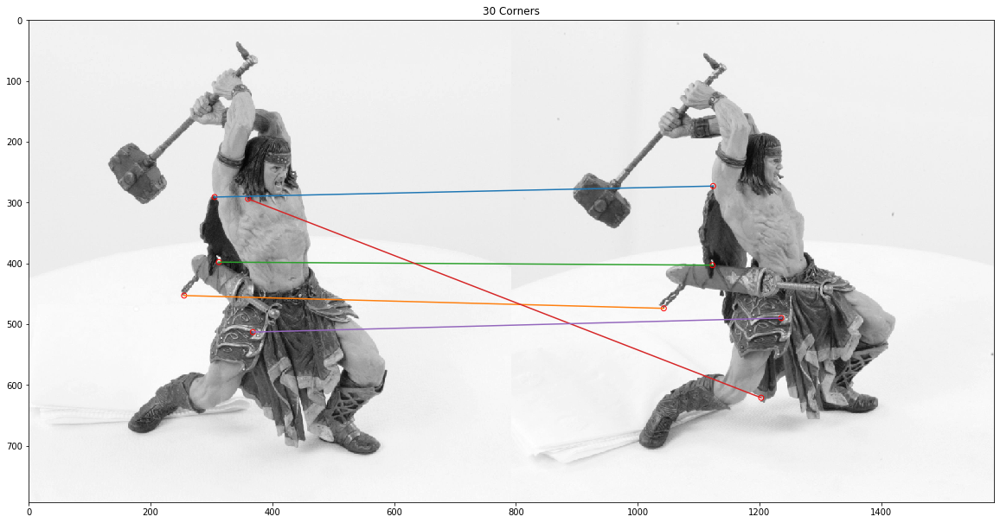

In [33]:
R = 30
NCCth = .3
d_thresh = .90
war_match10 = naive_matching(warl_im/255, warr_im/255, (warl_10y,warl_10x), (warr_10y,warr_10x), R, NCCth,d_thresh)
war_match20 = naive_matching(warl_im/255, warr_im/255, (warl_20y,warl_20x), (warr_20y,warr_20x), R, NCCth,d_thresh)
war_match30 = naive_matching(warl_im/255, warr_im/255, (warl_30y,warl_30x), (warr_30y,warr_30x), R, NCCth,d_thresh)

war_bundle = [[(warl_10y,warl_10x),(warr_10y,warr_10x),war_match10],\
              [(warl_20y,warl_20x),(warr_20y,warr_20x),war_match20],\
              [(warl_30y,warl_30x),(warr_30y,warr_30x),war_match30]]

#           10,20,30    c1,c2,matchpair   y_values,x_values or pair set
# mat_bundle[0]         [0]               [0]

for i in range(3):
    show_matching_result(warl_im,warr_im,war_bundle[i][0],war_bundle[i][1],war_bundle[i][2],i)

[398, 390, 369, 572, 291, 471, 577, 245, 475, 575]

### Epipolar Geometry [4 pts]

Complete the <code>compute_fundamental</code> function below using 8 point algorithm described in [Lecture 8](http://cseweb.ucsd.edu/classes/fa19/cse252A-a/lec8.pdf). Using the <code>fundamental_matrix</code> function and the corresponding points provided in cor1.npy and cor2.npy, calculate the fundamental matrix for the set of matrix and warrior image. Note that the normalization of the corner point is handled in the <code>fundamental_matrix</code> function.

In [35]:
import numpy as np
from imageio import imread
import matplotlib.pyplot as plt
from scipy.io import loadmat

def compute_fundamental(x1,x2):
    """    Computes the fundamental matrix from corresponding points 
        (x1,x2 3*n arrays) using the 8 point algorithm.
        Each row in the A matrix below is constructed as
        [x'*x, x'*y, x', y'*x, y'*y, y', x, y, 1] 

        Returns:
        Fundamental Matrix (3x3)

    """
    
    """
    Your code here
    """
    n = x1.shape[1]
    if x2.shape[1] != n:
        raise ValueError("Number of points don't match.")
    
    #return your F matrix
    x = x1[0]
    y = x1[1]
    xp = x2[0]
    yp = x2[1]
    
    
    for i in range(x.shape[0]):
        if i == 0:
            data_mat = np.array([[x[i]*xp[i],\
                                 xp[i]*y[i],\
                                 xp[i],     \
                                 yp[i]*x[i],\
                                 yp[i]*y[i],\
                                 yp[i],     \
                                 x[i],      \
                                 y[i],      \
                                 1]])
            
        else:
            next_row = np.array([[x[i]*xp[i],\
                                   xp[i]*y[i],\
                                   xp[i],     \
                                   yp[i]*x[i],\
                                   yp[i]*y[i],\
                                   yp[i],     \
                                   x[i],      \
                                   y[i],      \
                                   1]])
            
            data_mat = np.vstack((data_mat,next_row))
    
#     #print(data_mat.shape)
#     # solve for f
#     b = -1*np.ones((x.shape[0],1))
    
# #     if x.shape[0] > 8:  
        
# #         #use least squares
# #         F_inv = np.linalg.pinv(data_mat)
# #         F = F_inv@b
# #     else:

#     # http://www.cs.cmu.edu/~16385/s17/Slides/12.4_8Point_Algorithm.pdf
    
#     #print(A.shape)
#     #print(u.shape,s.shape,vh.shape)
#     #print(V.shape)
#     #print(F.shape)
#     #print(F)
#     #print(u.shape,S.shape,vh.shape)
    
    A = data_mat.T@data_mat
    u,s,vh = np.linalg.svd(A,full_matrices = False)
    V = vh.T
    F = V[:,-1]
    F = F.reshape((3,3))
    Fu,Fs,Fvh = np.linalg.svd(F)
    S = np.diag(Fs)
    S[2,2] = 0
    Fnew = Fu@S@Fvh
    F = Fnew
    


    #print(F)
    #F = F.reshape((3,3))
    #F should be rank 2
    #print(F)
#     u,s,vh = np.linalg.svd(F,full_matrices = True)
#     S = np.diag(s)
#     S[2,2] = 0
#     print(u,S,vh)
#     F = u@S@vh
    
    return F


def fundamental_matrix(x1,x2):
    # Normalization of the corner points is handled here
    n = x1.shape[1]
    if x2.shape[1] != n:
        raise ValueError("Number of points don't match.")

    # normalize image coordinates
    x1 = x1 / x1[2]
    mean_1 = np.mean(x1[:2],axis=1)
    S1 = np.sqrt(2) / np.std(x1[:2])
    T1 = np.array([[S1,0,-S1*mean_1[0]],[0,S1,-S1*mean_1[1]],[0,0,1]])
    x1 = np.dot(T1,x1)
    
    x2 = x2 / x2[2]
    mean_2 = np.mean(x2[:2],axis=1)
    S2 = np.sqrt(2) / np.std(x2[:2])
    T2 = np.array([[S2,0,-S2*mean_2[0]],[0,S2,-S2*mean_2[1]],[0,0,1]])
    x2 = np.dot(T2,x2)

    # compute F with the normalized coordinates
    F = compute_fundamental(x1,x2)

    # reverse normalization
    F = np.dot(T1.T,np.dot(F,T2))

    return F/F[2,2]

In [54]:
################## CALCULATE F #################

cor1 = np.load("./p4/matrix/cor1.npy")
cor2 = np.load("./p4/matrix/cor2.npy")

fundamental_matrix(cor1,cor2)


array([[-1.60483389e-07, -1.06948495e-07, -5.84655019e-04],
       [-1.60436874e-06, -4.07287627e-07, -5.61172727e-03],
       [-3.74801155e-04,  6.46605756e-03,  1.00000000e+00]])

### Plot Epipolar Lines [5 pts]
Using this fundamental matrix, plot the epipolar lines in both image pairs across all images. For this part you may want to complete the function <code>plot_epipolar_lines</code>. Shown your result for matrix and warrior as the figure below. 
![Dino Epipolar](fig/dinoEpi1.png)
![Dino Epipolar](fig/dinoEpi2.png)

Also, write the script to calculate the epipoles for a given Fundamental matrix and corner point correspondences in the two images.

In [36]:
def compute_epipole(F):
    '''
    This function computes the epipoles for a given fundamental matrix 
    and corner point correspondences
    input:
    F--> Fundamental matrix
    output:
    e1--> corresponding epipole in image 1
    e2--> epipole in image2
    '''
    
    '''
    Fp' = 0 -> e1
    F.Tp = 0 -> e2
    
    '''
    
    # this should be correct
    _,_,Vt = np.linalg.svd(F)
    e1     = Vt.T[:,-1]/Vt.T[-1,-1]
    # do epipoles need to be homogenized - yes they do
    _,_,Vt = np.linalg.svd(F.T)
    e2     = Vt.T[:,-1]/Vt.T[-1,-1]
    return e1,e2





def plot_epipolar_lines(img1,img2, cor1, cor2):
    """Plot epipolar lines on image given image, corners

    Args:
        img1: Image 1.
        img2: Image 2.
        cor1: Corners in homogeneous image coordinate in image 1 (3xn)
        cor2: Corners in homogeneous image coordinate in image 2 (3xn)

    """
        
    
    """
    Your code here:
    """
    F = fundamental_matrix(cor1,cor2)
    e1,e2 = compute_epipole(F)
    #print(F.T@e2)  # sanity check
    
    
    plt.figure(figsize = (20,10))
    plt.subplot(1,2,1)
    if np.ndim(img1) == 2:
        plt.imshow(img1,cmap = 'gray')
    else:
        plt.imshow(img1)
    plt.scatter(cor1[0,:],cor1[1,:],s=36,color = 'red')
    
    for i in range(cor1[0].shape[0]):
        
        x_vec = np.array([cor1[0][i],cor1[1][i]])
        
        m = (x_vec[1]-e1[1])/(x_vec[0]-e1[0])
        b = x_vec[1]-m*x_vec[0]
        
        x_line = []
        y_line = []
        for j in range(img1.shape[1]):
            y = m*j+b
            y_max  = img1.shape[0]
            if y>0 and y<y_max-1:
                x_line.append(j)
                y_line.append(y)
        plt.plot(x_line,y_line,color = 'blue')

    
    plt.subplot(1,2,2)
    if np.ndim(img2) == 2:
        plt.imshow(img2,cmap = 'gray')
    else:
        plt.imshow(img2)
    plt.scatter(cor2[0,:],cor2[1,:],s=36,color = 'red')
    
    for i in range(cor2[0].shape[0]):
        
        x_vec = np.array([cor2[0][i],cor2[1][i]])
        
        m = (x_vec[1]-e2[1])/(x_vec[0]-e2[0])
        b = x_vec[1]-m*x_vec[0]
        
        x_line = []
        y_line = []
        for j in range(img2.shape[1]):
            y = m*j+b
            y_max  = img2.shape[0]
            if y>0 and y<y_max-1:
                x_line.append(j)
                y_line.append(y)
        plt.plot(x_line,y_line,color = 'blue')
    plt.show()
        
    
    # calc the fundamental matrix
    
    
    

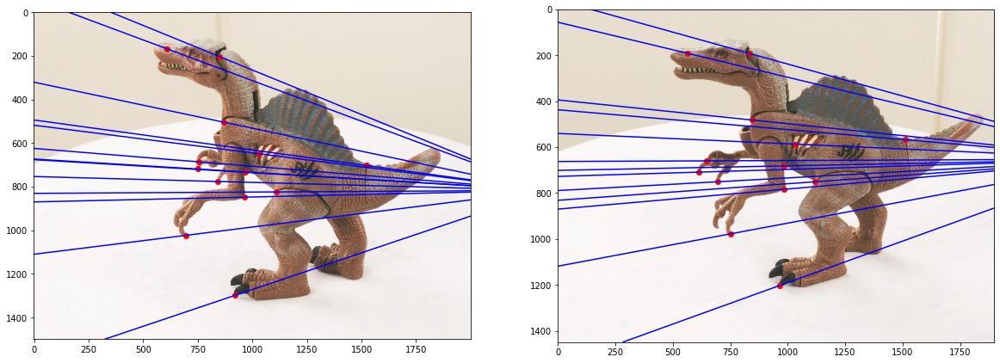

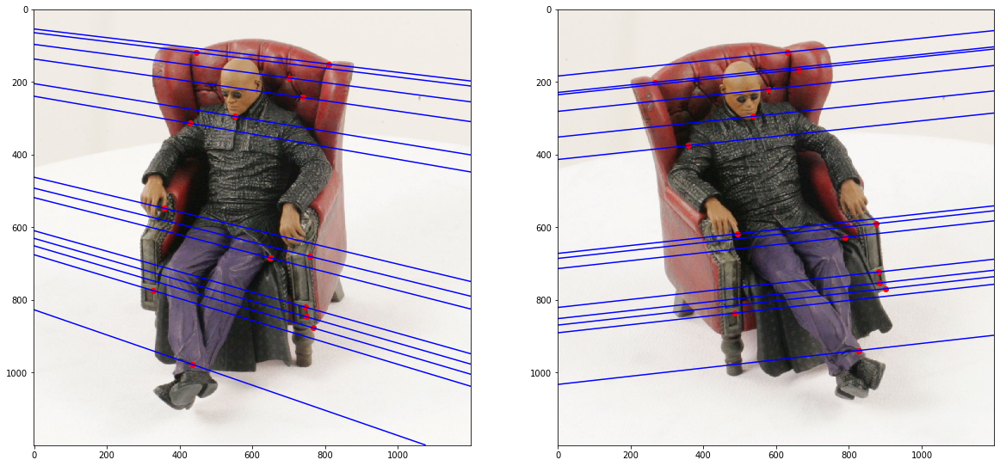

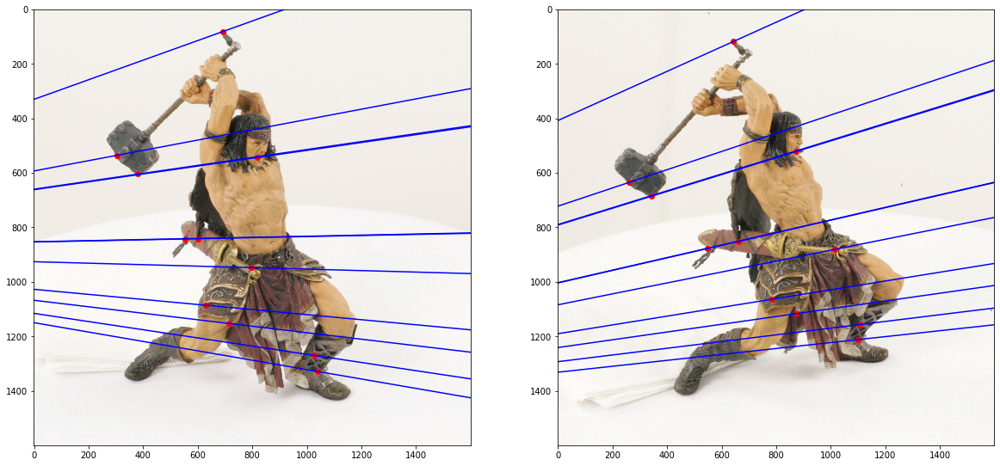

In [37]:
# replace images and corners with those of matrix and warrior
imgids = ["dino", "matrix", "warrior"]
for imgid in imgids:
    I1 = imageio.imread("./p4/"+imgid+"/"+imgid+"0.png")
    I2 = imageio.imread("./p4/"+imgid+"/"+imgid+"1.png")

    cor1 = np.load("./p4/"+imgid+"/cor1.npy")
    cor2 = np.load("./p4/"+imgid+"/cor2.npy")
    plot_epipolar_lines(I1,I2,cor1,cor2)

### Image Rectification [5 pts]
 An interesting case for epipolar geometry occurs when two images are parallel to each other. In this case, there is no rotation component involved between the two images and the essential matrix is $\texttt{E}=[\boldsymbol{T_{x}}]\boldsymbol{R}=[\boldsymbol{T_{x}}]$. Also if you observe the epipolar lines $\boldsymbol{l}$ and $\boldsymbol{l^{'}}$ for parallel images, they are horizontal and consequently, the corresponding epipolar lines share the same vertical coordinate. Therefore the process of making images parallel becomes useful while discerning the relationships between corresponding points in images.
 Rectifying a pair of images can also be done for uncalibrated camera images (i.e. we do not require the camera matrix of intrinsic parameters). Using the fundamental matrix we can find the pair of epipolar lines $\boldsymbol{l_i}$ and $\boldsymbol{l^{'}_i}$ for each of the correspondences. The intersection of these lines will give us the respective epipoles $\boldsymbol{e}$ and $\boldsymbol{e^{'}}$.  Now to make the epipolar lines to be parallel we need to map the epipoles to infinity. Hence , we need to find a homography that maps the epipoles to infinity. The method to find the homography has been implemented for you. You can read more about the method used to estimate the homography in the paper "Theory and Practice of Projective Rectification" by Richard Hartley.
 ![Image Rectification Setup](image_rectification.png)
 Using the compute_epipoles function from the previous part and the given compute_matching_homographies function, find the rectified images and plot the parallel epipolar lines using the plot_epipolar_lines function from above. You need to do this for both the matrix and the warrior images. A sample output will look as below:
 ![sample rectification](Sample_rectification.png)

In [38]:
# convert points from euclidian to homogeneous
def to_homog(points): #here always remember that points is a 3x4 matrix
    
    # we add ones to the tail end of the matrix
    
    points = np.vstack((points,np.ones([1,len(points[0,:])]).astype(float)))
    
    # np.ones([1,len(points[0,:])]) is the number of columns
    
    return points


# convert points from homogeneous to euclidian
def from_homog(points_homog):
    points_eud = np.zeros((points_homog.shape[0]-1,points_homog.shape[1])).astype(float) # same size minus one row
    
    for i in range(points_homog.shape[1]): # iterate over the columns
        points_eud[:,i] = points_homog[:-1,i]/points_homog[-1,i] # do I need to make the last row == 1?
    
    return points_eud

In [39]:
def compute_matching_homographies(e2, F, im2, points1, points2):
    
    '''This function computes the homographies to get the rectified images
    input:
    e2--> epipole in image 2
    F--> the Fundamental matrix (Think about what you should be passing F or F.T!)
    im2--> image2
    points1 --> corner points in image1
    points2--> corresponding corner points in image2
    output:
    H1--> Homography for image 1
    H2--> Homography for image 2
    '''
    # calculate H2
    width = im2.shape[1]
    height = im2.shape[0]

    T = np.identity(3)
    T[0][2] = -1.0 * width / 2
    T[1][2] = -1.0 * height / 2

    e = T.dot(e2)
    e1_prime = e[0]
    e2_prime = e[1]
    if e1_prime >= 0:
        alpha = 1.0
    else:
        alpha = -1.0

    R = np.identity(3)
    R[0][0] = alpha * e1_prime / np.sqrt(e1_prime**2 + e2_prime**2)
    R[0][1] = alpha * e2_prime / np.sqrt(e1_prime**2 + e2_prime**2)
    R[1][0] = - alpha * e2_prime / np.sqrt(e1_prime**2 + e2_prime**2)
    R[1][1] = alpha * e1_prime / np.sqrt(e1_prime**2 + e2_prime**2)

    f = R.dot(e)[0]/R.dot(e)[2]
    G = np.identity(3)
    G[2][0] = - 1.0 / f

    H2 = np.linalg.inv(T).dot(G.dot(R.dot(T)))

    # calculate H1
    e_prime = np.zeros((3, 3))
    e_prime[0][1] = -e2[2]
    e_prime[0][2] = e2[1]
    e_prime[1][0] = e2[2]
    e_prime[1][2] = -e2[0]
    e_prime[2][0] = -e2[1]
    e_prime[2][1] = e2[0]

    v = np.array([1, 1, 1])
    M = e_prime.dot(F) + np.outer(e2, v)

    points1_hat = H2.dot(M.dot(points1.T)).T
    points2_hat = H2.dot(points2.T).T

    W = points1_hat / points1_hat[:, 2].reshape(-1, 1)
    b = (points2_hat / points2_hat[:, 2].reshape(-1, 1))[:, 0]

    # least square problem
    a1, a2, a3 = np.linalg.lstsq(W, b)[0]
    HA = np.identity(3)
    HA[0] = np.array([a1, a2, a3])

    H1 = HA.dot(H2).dot(M)
    return H1, H2

def image_rectification(im1,im2,points1,points2):
    '''this function provides the rectified images along with the new corner points as outputs for a given pair of 
    images with corner correspondences
    input:
    im1--> image1
    im2--> image2
    points1--> corner points in image1
    points2--> corner points in image2
    outpu:
    rectified_im1-->rectified image 1
    rectified_im2-->rectified image 2
    new_cor1--> new corners in the rectified image 1
    new_cor2--> new corners in the rectified image 2
    '''
    "your code here"
    F = fundamental_matrix(points1,points2)
    e1,e2 = compute_epipole(F)
    H1,H2 = compute_matching_homographies(e2, F, im2, points1.T, points2.T)
    
    #print(H1)
    #print(H2)
    H1_inv    = np.linalg.inv(H1)
    H2_inv    = np.linalg.inv(H2)
    
    
    #### HOMOGRAPHY SECTION ####
    
    
    # image 1
    
    target_image1 = np.zeros(im1.shape)
    source_image = im1
    # borrowing code from assignment 2
    for j in range(im1.shape[0]): # rows = y value
        for i in range(im1.shape[1]): #columns = x_value
                
                try:
                    target_pixel_loc = np.array([[i,j,1]]).T                # homogenize the coordinate in the target image
                    transformed_coords = H1_inv@target_pixel_loc
                    transformed_coords = from_homog(transformed_coords)     #dehomogenize

                    source_j, source_i = transformed_coords[1].astype(int),transformed_coords[0].astype(int)  # grabs the new i,j, coordinates
                    if source_j < 0 or source_i < 0:
                        pass
                    else:
                        target_image1[j,i] = source_image[source_j,source_i]

                except:
                    pass
                
    # image 2
    
    target_image2 = np.zeros(im2.shape)
    source_image = im2
    for j in range(im2.shape[0]): # rows = y value
        for i in range(im2.shape[1]): #columns = x_value

            try:
                target_pixel_loc = np.array([[i,j,1]]).T                # homogenize the coordinate in the target image
                transformed_coords = H2_inv@target_pixel_loc
                transformed_coords = from_homog(transformed_coords)     #dehomogenize

                source_j, source_i = transformed_coords[1].astype(int),transformed_coords[0].astype(int)  # grabs the new i,j, coordinates
                target_image2[j,i] = source_image[source_j,source_i]

            except:
                pass
            
    
    # new corner coordinates x,y - image 1
    
    new_coordsx1 = []
    new_coordsy1 = []
    
    #print(points[1],points[1].shape)
    for j in range(points1[1].shape[0]): # rows = y value
            
            target_pixel_loc = np.array([[points1[0][j],points1[1][j],1]]).T
            transformed_coords = H1@target_pixel_loc
            transformed_coords = from_homog(transformed_coords)
            
            new_coordsx1.extend([transformed_coords[0]])
            new_coordsy1.extend([transformed_coords[1]])
            
    
    new_coords1 = np.vstack((np.array([new_coordsx1]),np.array([new_coordsy1])))
    # flatten the data to make it easier to access, return x,y pairs
    new_coords1 = np.vstack((new_coords1[0].flatten(),new_coords1[1].flatten())).astype(int)
    
    
    # new corner coordinates x,y image 2
    new_coordsx2 = []
    new_coordsy2 = []
    
    #print(points[1],points[1].shape)
    for j in range(points1[1].shape[0]): # rows = y value
            
            target_pixel_loc = np.array([[points2[0][j],points2[1][j],1]]).T
            transformed_coords = H2@target_pixel_loc
            transformed_coords = from_homog(transformed_coords)
            
            new_coordsx2.extend([transformed_coords[0]])
            new_coordsy2.extend([transformed_coords[1]])
            
    
    new_coords2 = np.vstack((np.array([new_coordsx2]),np.array([new_coordsy2])))
    new_coords2 = np.vstack((new_coords2[0].flatten(),new_coords2[1].flatten())).astype(int)               
    
    
    return  target_image1,target_image2,new_coords1,new_coords2

In [40]:
def plot_rectified_images(Im1,Im2,C1,C2):
    plt.figure(figsize = (20,20))
    plt.subplot(1,2,1)
    plt.imshow(Im1,cmap = 'gray')
    plt.scatter(C1[0],C1[1],s=50,color = 'blue')
    for i in range(len(C1[0])):
        # plot the horizontal line for each y coord
        y_coord = C1[1][i]
        x_min = 0
        x_max = Im1.shape[1]-1
        
        plt.plot([x_min,x_max],[y_coord,y_coord],color = 'red')
    
    
    plt.subplot(1,2,2)
    plt.imshow(Im2,cmap = 'gray')
    plt.scatter(C2[0],C2[1],s=50,color = 'blue')
    for i in range(len(C2[0])):
        # plot the horizontal line for each y coord
        y_coord = C2[1][i]
        x_min = 0
        x_max = Im2.shape[1]-1
        
        plt.plot([x_min,x_max],[y_coord,y_coord],color = 'red')

    plt.show()
    plt.show()
    


In [41]:
I1 = imageio.imread("./p4/matrix/matrix0.png")
I2 = imageio.imread("./p4/matrix/matrix1.png")
cor1 = np.load("./p4/matrix/cor1.npy")
cor2 = np.load("./p4/matrix/cor2.npy")
I1 = rgb2gray(I1)
I2 = rgb2gray(I2)


I3 = imageio.imread("./p4/warrior/warrior0.png")
I4 = imageio.imread("./p4/warrior/warrior1.png")
cor3 = np.load("./p4/warrior/cor1.npy")
cor4 = np.load("./p4/warrior/cor2.npy")

I3 = rgb2gray(I3)
I4 = rgb2gray(I4)




In [42]:
T1,T2,C1,C2 = image_rectification(I1,I2,cor1,cor2)
T3,T4,C3,C4 = image_rectification(I3,I4,cor3,cor4)

C1_h = np.vstack([C1,np.ones([1,len(C1[0])])])
C2_h = np.vstack([C2,np.ones([1,len(C2[0])])])



C:\Users\Steve\Anaconda2\envs\Conda36\lib\site-packages\ipykernel_launcher.py:61: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


In [43]:
C3_h = np.vstack([C3,np.ones([1,len(C3[0])])])
C4_h = np.vstack([C3,np.ones([1,len(C4[0])])])

In [44]:
np.ndim(T1)

2

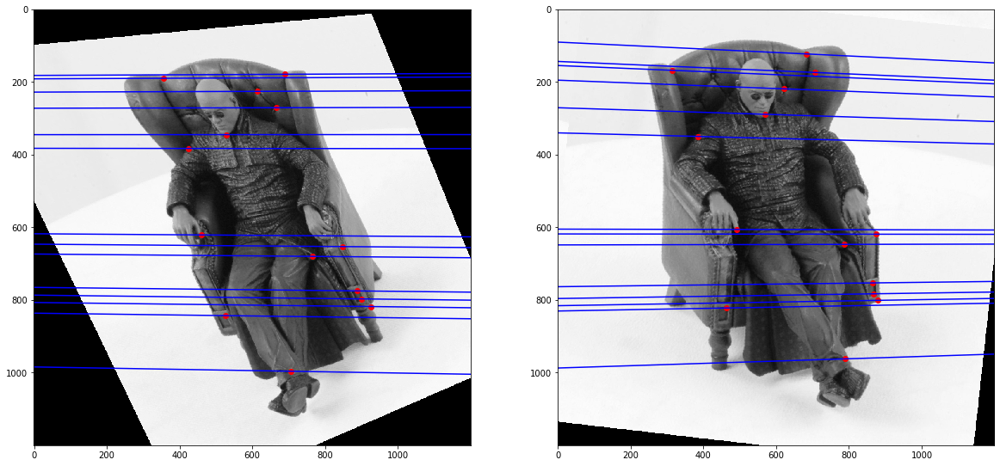

In [45]:
#plot_rectified_images(T1,T2,C1,C2)
plot_epipolar_lines(T1,T2,C1_h,C2_h)

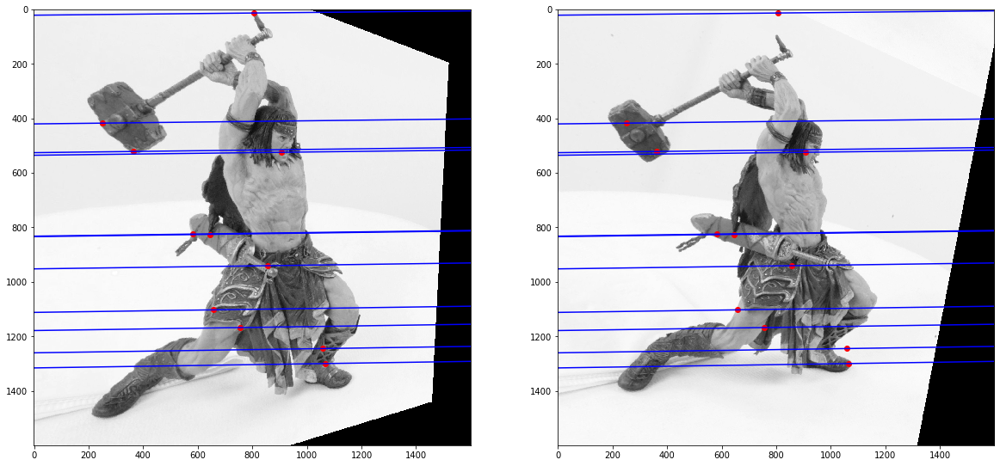

In [46]:
plot_epipolar_lines(T3,T4,C3_h,C4_h)

### Matching Using epipolar geometry[4 pts]

We will now use the epipolar geometry constraint on the rectified images and updated corner points to build a better matching algorithm. First, detect 10 corners
in Image1. Then, for each corner, do a linesearch along the corresponding parallel epipolar line in Image2.
Evaluate the NCC score for each point along this line and return the best match (or no match if all
scores are below the NCCth). R is the radius (size) of the NCC patch in the code below.  You do not
have to run this in both directions. Show your result as in the naive matching part. Execute this for the warrior and matrix images (**Total two outputs images**).

In [48]:
def show_matching_rec_result(img1, img2,c1,match_list): # corners are fed in as (y,x) pairs, match_list is (x,y)
    fig = plt.figure(figsize=(20, 20))
    plt.imshow(np.hstack((img1, img2)), cmap='gray') # two dino images are of different sizes, resize one before use
    for i in range(len(c1[0])):
        if len(match_list[i])>0:
            plt.scatter(c1[1][i], c1[0][i], s=35, edgecolors='r', facecolors='none')
            plt.scatter(match_list[i][0] + img1.shape[1], match_list[i][1], s=35, edgecolors='r', facecolors='none')
            plt.plot([c1[1][i],match_list[i][0] + img1.shape[1]],[c1[0][i],match_list[i][1]])

    pass
    plt.show()

def correspondence_matching_epipole(img1, img2, corners1, F, R, NCCth):
    """Find corner correspondence along epipolar line.

    Args:
        img1: Image 1.
        img2: Image 2.
        corners1: Detected corners in image 1.
        F: Fundamental matrix calculated using given ground truth corner correspondences.
        R: NCC matching window radius.
        NCCth: NCC matching threshold.
    
    
    Returns:
        Matching result to be used in display_correspondence function

    """
    """
    Your code here.
    
    """
    
    windowSize = 2*R+1

    match_list = []
    for i in range(len(corners1[0])):
        
        best_match = -1
        match_loc  = ()
                
        corner_pixel_loc = [corners1[0][i],corners1[1][i]] # (y,x)
        
        cx = corner_pixel_loc[1]
        cy = corner_pixel_loc[0]
        c1_h = np.array([[cx],[cy],[1]])
        im2_line = F.T@c1_h
        #ax+by+c = 0
        #y = -(ax+c)/b -> ignore x
        b = im2_line[1]
        c = im2_line[2]
        im_2_y = int(-c/b)
        
        c1_yx = corner_pixel_loc
        #print(c1_yx)
        
        # get the y coordinate in the second image

        # go horizontally across the second image
        for j in range(windowSize//2,img2.shape[1]-windowSize//2): # x location
            c2 = [im_2_y,j] # expects c1 and c2 to be in (y,x) pairs
            #print(c1_yx,c2)
            try:
                match = ncc_match(img1/255, img2/255, c1_yx, c2, R)
                if match > best_match and match > NCCth:

                        best_match = match
                        match_loc = (j,c1_yx[0])       # output is in x,y pairs
            except:
                pass
                #print('out of bounds (%i,%i)'%(im_2_y,j))
                # window is out of bounds
        
        # match list returns the corresponding points in the right images pertaining to the corners
        match_list.extend([match_loc])
    
    # list of (x,y) correspondances for each point
    return match_list
    
    


In [50]:
# show_matching_rec_result(T1,T2,C1,match_list)

C:\Users\Steve\Anaconda2\envs\Conda36\lib\site-packages\ipykernel_launcher.py:61: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


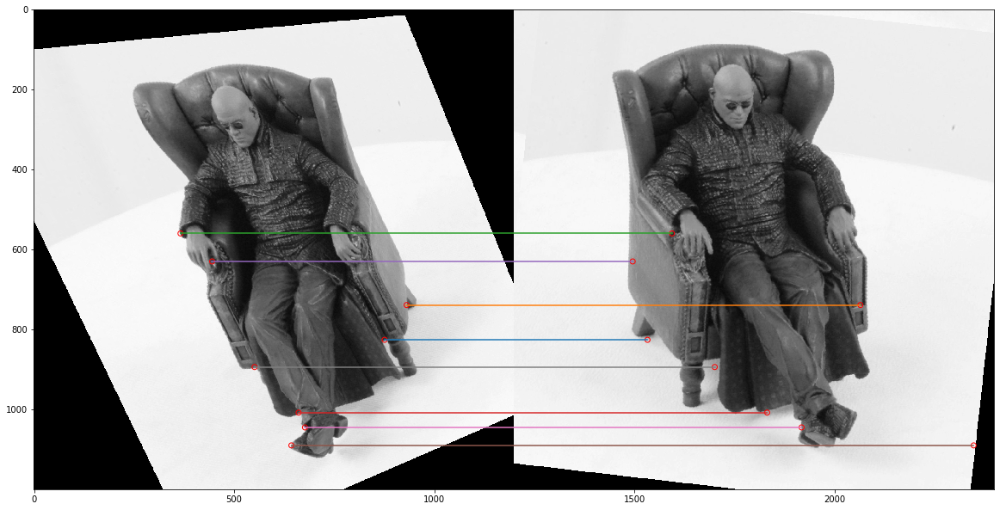

In [52]:
I1 = imageio.imread("./p4/matrix/matrix0.png")
I2 = imageio.imread("./p4/matrix/matrix1.png")
I1 = rgb2gray(I1)
I2 = rgb2gray(I2)
cor1 = np.load("./p4/matrix/cor1.npy")
cor2 = np.load("./p4/matrix/cor2.npy")
I3 = imageio.imread("./p4/warrior/warrior0.png")
I4 = imageio.imread("./p4/warrior/warrior1.png")
I3 = rgb2gray(I3)
I4 = rgb2gray(I4)
cor3 = np.load("./p4/warrior/cor1.npy")
cor4 = np.load("./p4/warrior/cor2.npy")

# For matrix
rectified_im1,rectified_im2,new_cor1,new_cor2 = image_rectification(I1,I2,cor1,cor2)
# homogenize coordinates
new_cor1 = np.vstack((new_cor1,np.ones((1,len(new_cor1[0])))))
new_cor2 = np.vstack((new_cor2,np.ones((1,len(new_cor2[0])))))
F_new = fundamental_matrix(new_cor1, new_cor2)

nCorners = 20
# # Choose your threshold
NCCth = 0.4
smoothSTD = 2
windowSize = 13
# #decide the NCC matching window radius
R = 20

# detect corners using corner detector here, store in corners1
corners1,_,_,_ = corner_detect(rectified_im1, nCorners, smoothSTD, windowSize)
corrs = correspondence_matching_epipole(rectified_im1, rectified_im2, corners1, F_new, R, NCCth)
show_matching_rec_result(rectified_im1, rectified_im2,corners1, corrs)



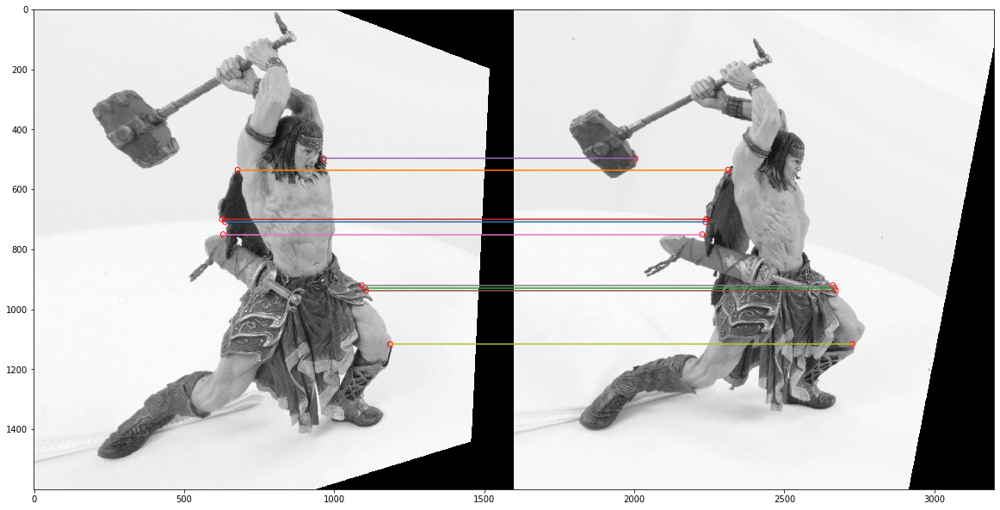

In [51]:

NCCth = 0.7
R = 30
# For warrior
rectified_im3,rectified_im4,new_cor3,new_cor4 = image_rectification(I3,I4,cor3,cor4)

new_cor3 = np.vstack((new_cor3,np.ones((1,len(new_cor3[0])))))
new_cor4 = np.vstack((new_cor4,np.ones((1,len(new_cor4[0])))))
F_new2=fundamental_matrix(new_cor3, new_cor4)

# You may wish to change your NCCth and R for warrior here.
corners2,_,_,_ = corner_detect(rectified_im3, nCorners, smoothSTD, windowSize)
corrs = correspondence_matching_epipole(rectified_im3, rectified_im4, corners2, F_new2, R, NCCth)
show_matching_rec_result(rectified_im3, rectified_im4,corners2, corrs)